In [4]:
conda install scipy

Channels:
 - defaults
Platform: osx-64
Solving environment: done

# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


In [9]:
# ===== Part 0: Imports & utils =====
# numpy, matplotlib, cv2

import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from scipy.signal import convolve2d


%matplotlib inline

MAE vs scipy: 9.7566776e-08 max abs diff: 1.2516975e-06


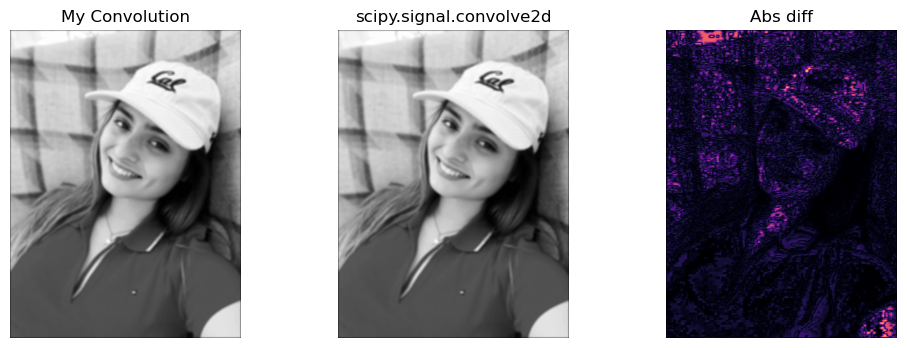

In [11]:

# ===== Part 1.1: Convolution =====
def conv2d_naive_4loops(img, kernel):
    img = img.astype(np.float32)
    k = np.array(kernel, dtype=np.float32)[::-1, ::-1]

    H, W = img.shape 
    kh, kw = k.shape 
    pad_h, pad_w = kh // 2, kw // 2 # padding is half the kernel size on each side.

    p = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant') 
    out = np.zeros((H, W), dtype = np.float32)

    for i in range(H):
        for j in range(W):
            acc = 0.0
            for u in range(kh):
                for v in range(kw):
                    acc += p[i + u, j + v] * k[u, v]
            out[i, j] = acc
    return out

#grayscale
img_path = "selfie.jpeg"
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE) # chose to use cv2 GRAYSCALE instead of BGR2GRAY
img = img.astype(np.float32) / 255.0


def conv2d_naive_2loops(img, kernel):
    img = img.astype(np.float32)
    k = np.array(kernel, dtype=np.float32)[::-1, ::-1]

    H, W = img.shape
    kh, kw = k.shape
    ph, pw = kh // 2, kw // 2

    p = np.pad(img, ((ph, ph), (pw, pw)), mode='constant')
    out = np.zeros((H, W), dtype=np.float32)

    for i in range(H):
        for j in range(W):
            region = p[i:i+kh, j:j+kw]      # kh×kw patch
            # TODO: one line – dot product of region and k
            out[i, j] = np.sum(region * k)  # <-- fill this
    return out
    
def conv2d_compare(img, kernel):  # vs scipy.signal.convolve2d
    my_result = conv2d_naive_2loops(img, kernel)

    # scipy convolution (same padding, same size)
    scipy_result = convolve2d(img, kernel, mode='same', boundary='fill', fillvalue=0)

    # difference
    diff = np.abs(my_result - scipy_result)
    print("MAE vs scipy:", diff.mean(), "max abs diff:", diff.max())

    fig, ax = plt.subplots(1,3, figsize=(12,4))
    ax[0].imshow(my_result, cmap='gray'); ax[0].set_title('My Convolution'); ax[0].axis('off')
    ax[1].imshow(scipy_result, cmap='gray'); ax[1].set_title('scipy.signal.convolve2d'); ax[1].axis('off')
    ax[2].imshow(diff, cmap='magma'); ax[2].set_title('Abs diff'); ax[2].axis('off')
    plt.show()

box9 = np.ones((9,9), dtype=np.float32) / 81.0
conv2d_compare(img, box9)

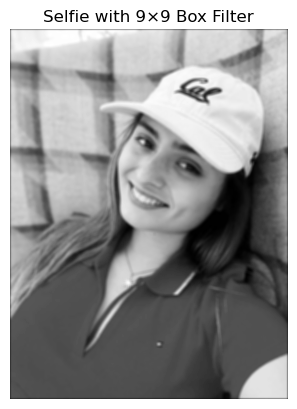

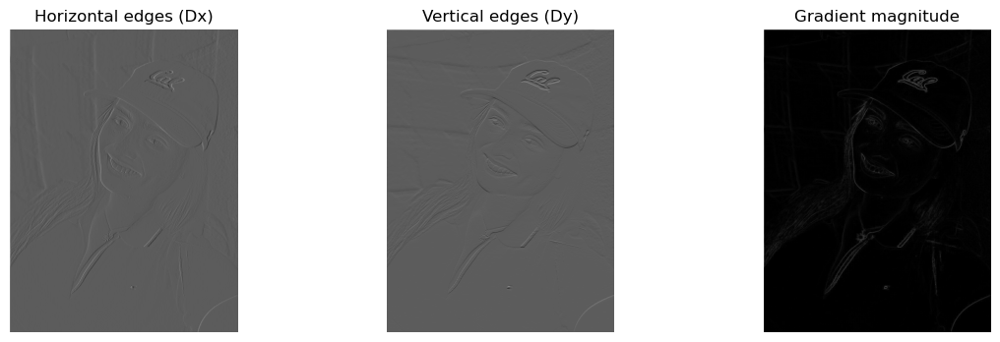

In [12]:
# 9x9 box filter
box9 = np.ones((9,9), dtype=np.float32) / 81.0
blur9 = conv2d_naive_2loops(img, box9)

plt.imshow(blur9, cmap='gray')
plt.title("Selfie with 9×9 Box Filter")
plt.axis('off')
plt.show()

plt.imsave("figs/blur9.png", blur9, cmap="gray")

# Finite Difference Operators

Dx = np.array([[1, -1]], dtype=np.float32)
Dy = np.array([[1], [-1]], dtype=np.float32)

Gx = conv2d_naive_2loops(img, Dx)
Gy = conv2d_naive_2loops(img, Dy)
mag = np.hypot(Gx, Gy)

fig, ax = plt.subplots(1,3, figsize=(14,4))
for a in ax: a.axis('off')
ax[0].imshow(Gx, cmap='gray'); ax[0].set_title('Horizontal edges (Dx)')
ax[1].imshow(Gy, cmap='gray'); ax[1].set_title('Vertical edges (Dy)')
ax[2].imshow(mag, cmap='gray'); ax[2].set_title('Gradient magnitude')
plt.show()

plt.imsave("figs/Gx.png", Gx, cmap="gray")
plt.imsave("figs/Gy.png", Gy, cmap="gray")
plt.imsave("figs/grad_mag.png", mag / mag.max(), cmap="gray")



libpng warning: iCCP: profile 'icc': 0h: PCS illuminant is not D50


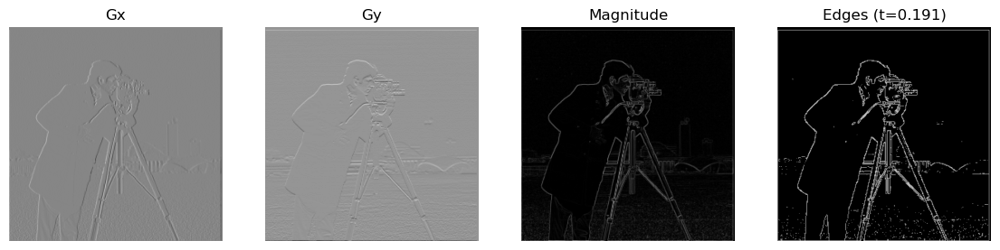

In [13]:

# ===== Part 1.2: Finite differences =====

img_path = "cameraman.png"
img_gray = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0


def finite_diff_edges(img, threshold):  # returns Gx, Gy, mag, edges
    
    Dx = np.array([[-1, 1]], dtype=np.float32)   # d/dx
    Dy = np.array([[-1], [1]], dtype=np.float32) # d/dy

    # Convolve with finite difference operators
    Gx = convolve2d(img, Dx, mode='same', boundary='symm')
    Gy = convolve2d(img, Dy, mode='same', boundary='symm')

    # Gradient magnitude
    mag = np.hypot(Gx, Gy)

    # Threshold for edges
    t = float(threshold) * float(mag.max())
    edges = (mag > t).astype(np.float32)

    # Visualize
    fig, ax = plt.subplots(1, 4, figsize=(14, 4))
    ax[0].imshow(Gx, cmap='gray'); ax[0].set_title('Gx'); ax[0].axis('off')
    ax[1].imshow(Gy, cmap='gray'); ax[1].set_title('Gy'); ax[1].axis('off')
    ax[2].imshow(mag / (mag.max()+1e-8), cmap='gray'); ax[2].set_title('Magnitude'); ax[2].axis('off')
    ax[3].imshow(edges, cmap='gray'); ax[3].set_title(f'Edges (t={t:.3f})'); ax[3].axis('off')
    plt.show()

    plt.imsave("figs/cameraman_gx.png", Gx, cmap="gray")
    plt.imsave("figs/cameraman_gy.png", Gy, cmap="gray")
    plt.imsave("figs/cameraman_mag.png", mag / mag.max(), cmap="gray")
    plt.imsave("figs/cameraman_edges.png", edges, cmap="gray")

    return Gx, Gy, mag, edges

# Run it
Gx, Gy, mag, edges = finite_diff_edges(img_gray, threshold=0.2)


libpng warning: iCCP: profile 'icc': 0h: PCS illuminant is not D50


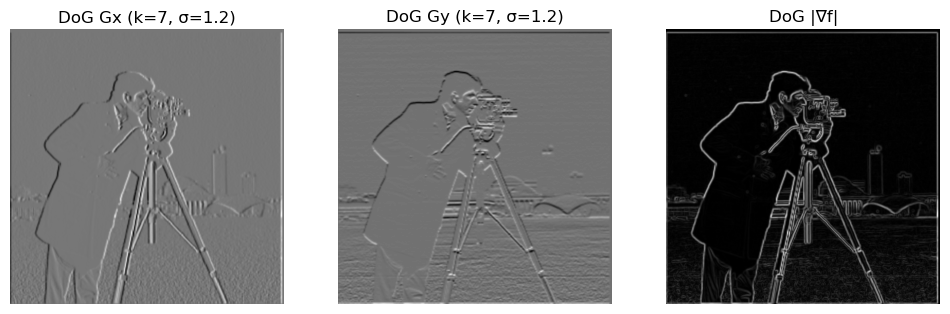

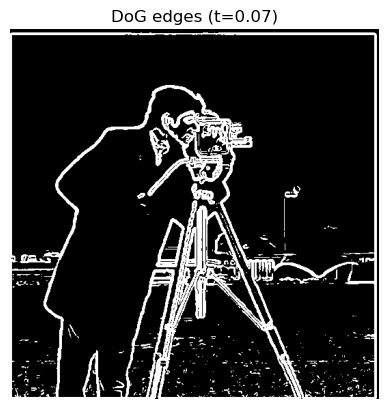

In [14]:
# ===== Part 1.3: Gaussian & DoG =====

img_path = "cameraman.png"
img_gray = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0

def gaussian_1d(ksize: int, sigma: float):
    """Return 1D Gaussian g and its derivative gd, both float32."""
    assert ksize % 2 == 1, "ksize must be odd"
    r = np.arange(-(ksize//2), ksize//2 + 1, dtype=np.float32)
    g = np.exp(-(r**2) / (2 * sigma**2))
    g /= g.sum()  # L1-normalize the Gaussian

    # derivative of Gaussian (proportional to -r/sigma^2 * g)
    gd = -(r / (sigma**2)) * g
    # Optional normalize for display stability (not mathematically required)
    gd /= np.sum(np.abs(gd)) + 1e-8
    return g.astype(np.float32), gd.astype(np.float32)

def conv_separable(img2d: np.ndarray, kcol: np.ndarray, krow: np.ndarray):
    """Convolve 2D img with column kernel then row kernel (both 1D)."""
    tmp = convolve2d(img2d, kcol[:, None], mode='same', boundary='symm')
    out = convolve2d(tmp, krow[None, :], mode='same', boundary='symm')
    return out

def dog_gradients(img2d: np.ndarray, ksize=7, sigma=1.2):
    """Derivative-of-Gaussian gradients (separable)."""
    g, gd = gaussian_1d(ksize, sigma)
    # Gx: smooth vertically with g, differentiate horizontally with gd
    Gx = conv_separable(img2d, g, gd)
    # Gy: differentiate vertically with gd, smooth horizontally with g
    Gy = conv_separable(img2d, gd, g)
    mag = np.hypot(Gx, Gy)
    return Gx, Gy, mag

# --- Run DoG and visualize ---
ksize, sigma = 7, 1.2  # tweak: ksize ∈ {5,7,9}, sigma ∈ [0.8, 2.0]
Gx, Gy, mag = dog_gradients(img_gray, ksize, sigma)

fig, ax = plt.subplots(1, 3, figsize=(12,4))
for a in ax: a.axis('off')
ax[0].imshow(Gx, cmap='gray'); ax[0].set_title(f'DoG Gx (k={ksize}, σ={sigma})')
ax[1].imshow(Gy, cmap='gray'); ax[1].set_title(f'DoG Gy (k={ksize}, σ={sigma})')
ax[2].imshow(mag / (mag.max()+1e-8), cmap='gray'); ax[2].set_title('DoG |∇f|')
plt.show()

# save
plt.imsave("figs/cameraman_dogx.png", Gx, cmap="gray")
plt.imsave("figs/cameraman_dogy.png", Gy, cmap="gray")
plt.imsave("figs/cameraman_dogf.png", mag / mag.max(), cmap="gray")


# Optional: edge map by thresholding the DoG magnitude
t = 0.15 * float(mag.max())  # tune 0.10–0.25
edges_dog = (mag > t).astype(np.float32)
plt.imshow(edges_dog, cmap='gray'); plt.title(f'DoG edges (t={t:.2f})'); plt.axis('off'); plt.show()

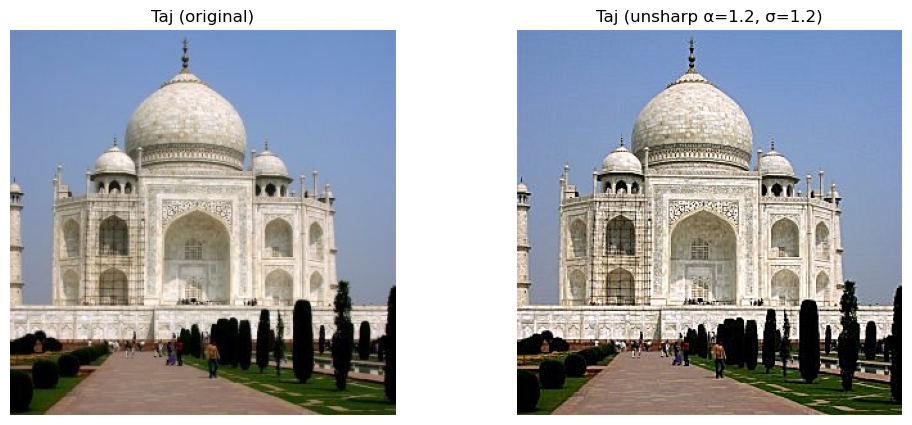

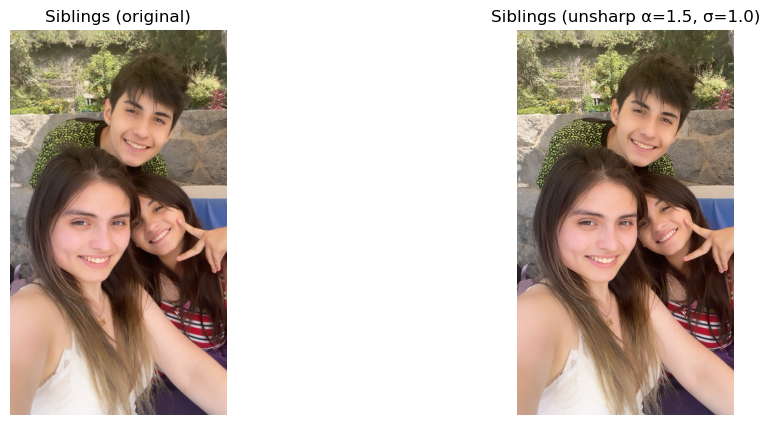

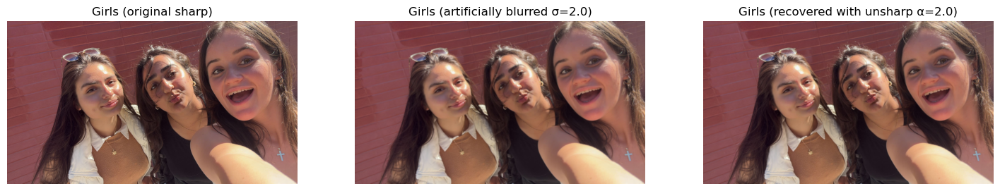

In [15]:
# ===== Part 2.1: Unsharp mask =====
# Colored images
taj_path = cv2.cvtColor(cv2.imread("taj.jpg"), cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
siblings_path = cv2.cvtColor(cv2.imread("siblings.jpg"), cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
girls_path = cv2.cvtColor(cv2.imread("girls.jpg"), cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

def ensure_odd(n: int) -> int:
    n = int(n)
    return n if (n % 2) == 1 else n + 1

def ksize_from_sigma(sigma: float) -> int:
    return ensure_odd(int(np.ceil(6 * float(sigma))))   # ~±3σ support

def gaussian_blur(img: np.ndarray, sigma: float, ksize: int | None = None) -> np.ndarray:
    k = ksize_from_sigma(sigma) if ksize is None else ensure_odd(ksize)
    return cv2.GaussianBlur(img, (k, k), sigmaX=sigma, sigmaY=sigma, borderType=cv2.BORDER_REFLECT)

def unsharp_mask(img: np.ndarray, alpha: float = 1.0, sigma: float = 1.0,
                 ksize: int | None = None) -> np.ndarray:
    blur = gaussian_blur(img, sigma, ksize)
    out  = img + alpha * (img - blur)
    return np.clip(out, 0.0, 1.0)

# --- run
taj_sharp = unsharp_mask(taj_path, alpha=1.2, sigma=1.2)
siblings_sharp = unsharp_mask(siblings_path, alpha=1.5, sigma=1.0)

# --- show (use matplotlib, not cv2.imshow)
fig, ax = plt.subplots(1, 2, figsize=(12,5))
ax[0].imshow(taj_path)
ax[0].set_title("Taj (original)")
ax[0].axis('off')
ax[1].imshow(taj_sharp)
ax[1].set_title("Taj (unsharp α=1.2, σ=1.2)")
ax[1].axis('off')
plt.show()

fig, ax = plt.subplots(1, 2, figsize=(12,5))
ax[0].imshow(siblings_path)
ax[0].set_title("Siblings (original)")
ax[0].axis('off')
ax[1].imshow(siblings_sharp)
ax[1].set_title("Siblings (unsharp α=1.5, σ=1.0)")
ax[1].axis('off')
plt.show()

# --- save to figs
plt.imsave("figs/taj_unsharp.png", taj_sharp)
plt.imsave("figs/siblings_unsharp.png", siblings_sharp)

# ===== Evaluation: Blur then Sharpen =====
# Take sharp image, blur it, then try to recover with unsharp mask
girls_blurred = gaussian_blur(girls_path, sigma=2.0)  # Apply significant blur
girls_recovered = unsharp_mask(girls_blurred, alpha=2.0, sigma=1.0)  # Try to recover

# Show all three stages
fig, ax = plt.subplots(1, 3, figsize=(18, 6))
ax[0].imshow(girls_path)
ax[0].set_title("Girls (original sharp)")
ax[0].axis('off')
ax[1].imshow(girls_blurred)
ax[1].set_title("Girls (artificially blurred σ=2.0)")
ax[1].axis('off')
ax[2].imshow(girls_recovered)
ax[2].set_title("Girls (recovered with unsharp α=2.0)")
ax[2].axis('off')
plt.show()

# Save evaluation results
plt.imsave("figs/girls_original.png", girls_path)
plt.imsave("figs/girls_blurred.png", girls_blurred)
plt.imsave("figs/girls_recovered.png", girls_recovered)

In [ ]:
# ===== Part 2.2: Hybrid images =====

# Load images
mom_path = cv2.cvtColor(cv2.imread("mom.jpg"), cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
dad_path = cv2.cvtColor(cv2.imread("dad.jpg"), cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

def low_pass(img, sigma, ksize=None):
    """Apply Gaussian low-pass filter"""
    k = ksize_from_sigma(sigma) if ksize is None else ensure_odd(ksize)
    return cv2.GaussianBlur(img, (k, k), sigmaX=sigma, sigmaY=sigma, borderType=cv2.BORDER_REFLECT)

def high_pass(img, sigma, ksize=None):
    """Apply high-pass filter: original - low_pass"""
    return img - low_pass(img, sigma, ksize)

def hybrid(img_low, img_high, sigma_low, sigma_high, ksize_low=None, ksize_high=None):
    """Create hybrid image: low frequencies from img_low + high frequencies from img_high"""
    low_freq = low_pass(img_low, sigma_low, ksize_low)
    high_freq = high_pass(img_high, sigma_high, ksize_high)
    result = low_freq + high_freq
    return np.clip(result, 0.0, 1.0), low_freq, high_freq

def show_fft(img, title="FFT"):
    """Display log magnitude of 2D Fourier Transform"""
    # Convert to grayscale if needed
    if len(img.shape) == 3:
        gray = 0.299 * img[:,:,0] + 0.587 * img[:,:,1] + 0.114 * img[:,:,2]
    else:
        gray = img
    
    # Compute FFT
    fft = np.fft.fft2(gray)
    fft_shift = np.fft.fftshift(fft)
    magnitude = np.log(np.abs(fft_shift) + 1e-8)
    
    # Display
    plt.figure(figsize=(8, 6))
    plt.imshow(magnitude, cmap='gray')
    plt.title(f'Log FFT Magnitude: {title}')
    plt.colorbar()
    plt.show()

# Create hybrid: Mom (low freq, visible close) + Dad (high freq, visible far)
sigma_low = 6
sigma_high = 6

mom_dad_hybrid, mom_low, dad_high = hybrid(mom_path, dad_path, sigma_low, sigma_high)

# Display results
fig, ax = plt.subplots(2, 3, figsize=(18, 12))

ax[0, 0].imshow(mom_path)
ax[0, 0].set_title("Mom (original)")
ax[0, 0].axis('off')

ax[0, 1].imshow(dad_path)
ax[0, 1].set_title("Dad (original)")
ax[0, 1].axis('off')

ax[0, 2].imshow(mom_dad_hybrid)
ax[0, 2].set_title(f"Hybrid (σ_low={sigma_low}, σ_high={sigma_high})")
ax[0, 2].axis('off')

ax[1, 0].imshow(mom_low)
ax[1, 0].set_title("Mom low-pass")
ax[1, 0].axis('off')

ax[1, 1].imshow(dad_high + 0.5)
ax[1, 1].set_title("Dad high-pass + 0.5")
ax[1, 1].axis('off')

ax[1, 2].imshow(mom_dad_hybrid)
ax[1, 2].set_title("Final hybrid")
ax[1, 2].axis('off')

plt.suptitle("Mom + Dad Hybrid Image", fontsize=16)
plt.tight_layout()_


<Figure size 640x480 with 0 Axes>

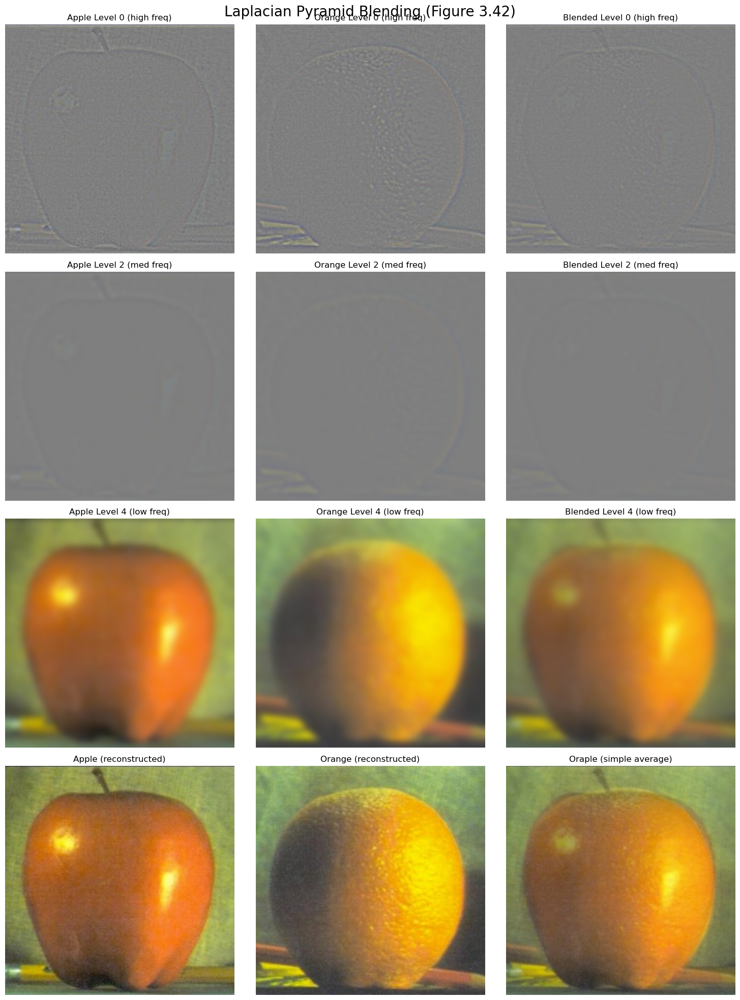

Created 5 levels in Gaussian and Laplacian stacks
All levels maintain original size: 300x300


In [22]:
# ===== Part 2.3: Gaussian & Laplacian stacks =====

def gaussian_stack(img, levels, sigma):
    """
    Create Gaussian stack (no downsampling, same size at all levels)
    Each level is increasingly blurred
    """
    stack = [img.copy()]
    current = img.copy()
    
    for i in range(levels - 1):
        # Apply Gaussian blur with increasing sigma
        current = gaussian_blur(current, sigma)
        stack.append(current.copy())
    
    return stack

def laplacian_stack(img, levels, sigma):
    """
    Create Laplacian stack from Gaussian stack
    L_i = G_i - G_{i+1} for all levels except last
    Last level is just the most blurred Gaussian
    """
    # First create Gaussian stack
    gauss_stack = gaussian_stack(img, levels, sigma)
    
    # Laplacian is difference between consecutive Gaussian levels
    lap_stack = []
    for i in range(levels - 1):
        lap_stack.append(gauss_stack[i] - gauss_stack[i + 1])
    
    # Last level is the final Gaussian (residual)
    lap_stack.append(gauss_stack[-1])
    
    return lap_stack

# ===== Recreate Figure 3.42 (Oraple) =====
# Load apple and orange images
apple = cv2.cvtColor(cv2.imread("spline/apple.jpeg"), cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
orange = cv2.cvtColor(cv2.imread("spline/orange.jpeg"), cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

# Make sure they're the same size
h, w = min(apple.shape[0], orange.shape[0]), min(apple.shape[1], orange.shape[1])
apple = cv2.resize(apple, (w, h))
orange = cv2.resize(orange, (w, h))

# Parameters for stacks
levels = 5
sigma = 2.0

# Create Gaussian and Laplacian stacks
apple_gauss = gaussian_stack(apple, levels, sigma)
orange_gauss = gaussian_stack(orange, levels, sigma)
apple_lap = laplacian_stack(apple, levels, sigma)
orange_lap = laplacian_stack(orange, levels, sigma)

# Visualize the stacks to match Figure 3.42
# Show 4 rows: levels 0, 2, 4, and final reconstruction
fig, axes = plt.subplots(4, 3, figsize=(15, 20))

# Rows 1-3: Show individual Laplacian levels (0, 2, 4)
display_levels = [0, 2, 4]
row_labels = ["Level 0 (high freq)", "Level 2 (med freq)", "Level 4 (low freq)"]

for row, level in enumerate(display_levels):
    # Apple - left column
    if level < levels - 1:
        axes[row, 0].imshow(np.clip(apple_lap[level] + 0.5, 0, 1))
    else:
        axes[row, 0].imshow(apple_lap[level])
    axes[row, 0].set_title(f"Apple {row_labels[row]}")
    axes[row, 0].axis('off')
    
    # Orange - middle column
    if level < levels - 1:
        axes[row, 1].imshow(np.clip(orange_lap[level] + 0.5, 0, 1))
    else:
        axes[row, 1].imshow(orange_lap[level])
    axes[row, 1].set_title(f"Orange {row_labels[row]}")
    axes[row, 1].axis('off')
    
    # Blended - right column
    if level < levels - 1:
        blended = (apple_lap[level] + orange_lap[level]) / 2
        axes[row, 2].imshow(np.clip(blended + 0.5, 0, 1))
    else:
        blended = (apple_lap[level] + orange_lap[level]) / 2
        axes[row, 2].imshow(blended)
    axes[row, 2].set_title(f"Blended {row_labels[row]}")
    axes[row, 2].axis('off')

# Row 4: Reconstruct full images by collapsing the stacks
apple_reconstructed = np.sum(apple_lap, axis=0)
orange_reconstructed = np.sum(orange_lap, axis=0)
oraple = np.sum([(apple_lap[i] + orange_lap[i]) / 2 for i in range(levels)], axis=0)

axes[3, 0].imshow(np.clip(apple_reconstructed, 0, 1))
axes[3, 0].set_title("Apple (reconstructed)")
axes[3, 0].axis('off')

axes[3, 1].imshow(np.clip(orange_reconstructed, 0, 1))
axes[3, 1].set_title("Orange (reconstructed)")
axes[3, 1].axis('off')

axes[3, 2].imshow(np.clip(oraple, 0, 1))
axes[3, 2].set_title("Oraple (simple average)")
axes[3, 2].axis('off')

plt.suptitle("Laplacian Pyramid Blending (Figure 3.42)", fontsize=20)
plt.tight_layout()
plt.show()

# Save visualization
plt.savefig("figs/laplacian_stacks_oraple.png", dpi=150, bbox_inches='tight')

print(f"Created {levels} levels in Gaussian and Laplacian stacks")
print(f"All levels maintain original size: {h}x{w}")    

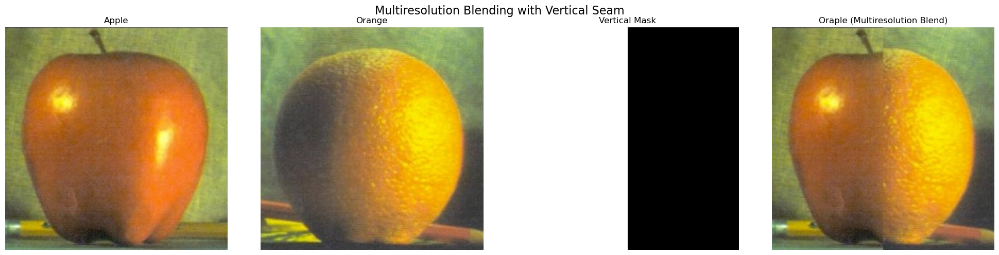

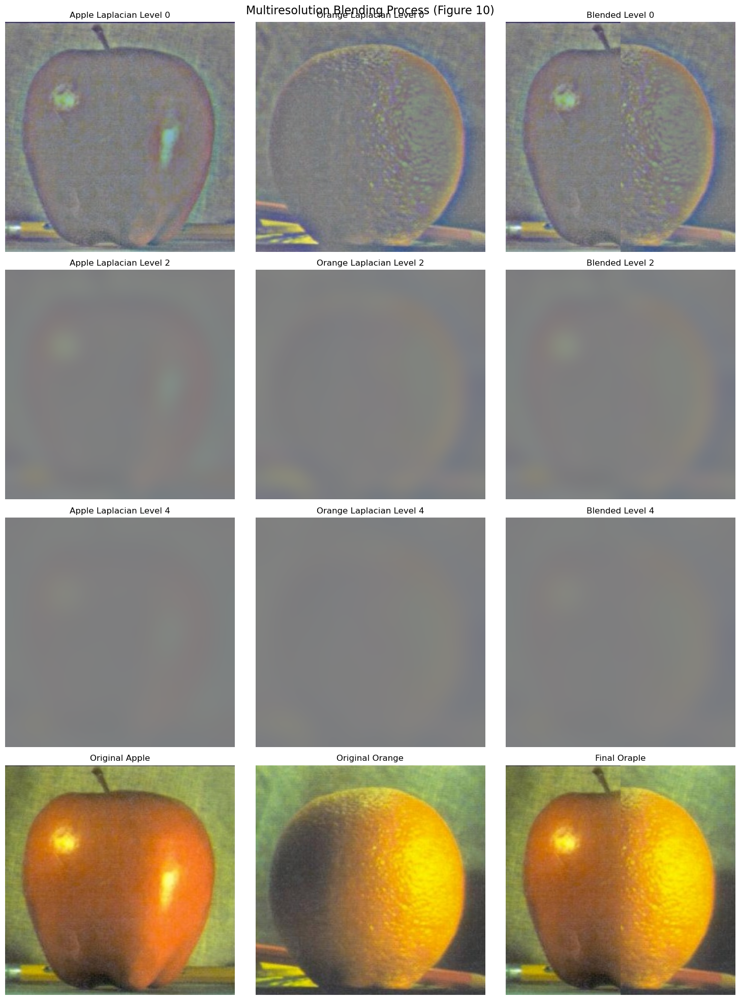

Oraple created with 6 levels, sigma=10.0
Notice how the seam is smoothly blended across different frequency bands!


<Figure size 640x480 with 0 Axes>

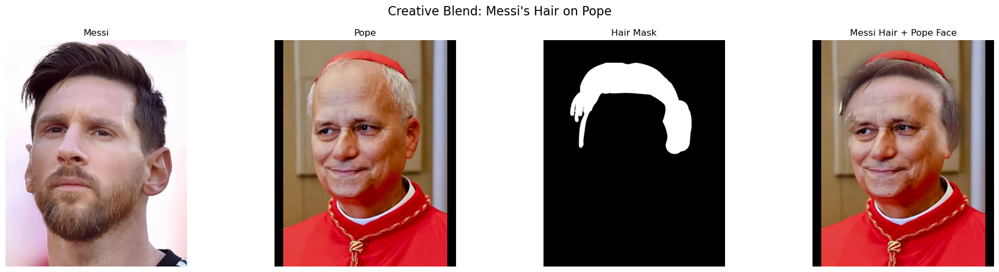

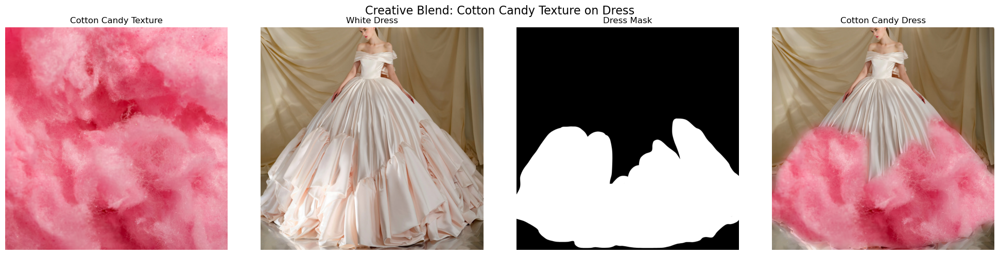

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from scipy.signal import convolve2d

def gaussian_stack(img, levels, sigma):
    """
    Create Gaussian stack (no downsampling, same size at all levels)
    Each level is increasingly blurred
    """
    stack = [img.copy()]
    current = img.copy()
    
    for i in range(levels - 1):
        # Apply Gaussian blur with increasing sigma
        current = gaussian_blur(current, sigma)
        stack.append(current.copy())
    
    return stack

def laplacian_stack(img, levels, sigma):
    """
    Create Laplacian stack from Gaussian stack
    L_i = G_i - G_{i+1} for all levels except last
    Last level is just the most blurred Gaussian
    """
    # First create Gaussian stack
    gauss_stack = gaussian_stack(img, levels, sigma)
    
    # Laplacian is difference between consecutive Gaussian levels
    lap_stack = []
    for i in range(levels - 1):
        lap_stack.append(gauss_stack[i] - gauss_stack[i + 1])
    
    # Last level is the final Gaussian (residual)
    lap_stack.append(gauss_stack[-1])
    
    return lap_stack

# ===== Part 2.4: Multiresolution blending =====

def multires_blend(imgA, imgB, mask, levels, sigma):
    """
    Blend two images using multiresolution blending with a mask.
    
    Algorithm:
    1. Build Laplacian stacks for imgA and imgB
    2. Build Gaussian stack for mask
    3. At each level i: blend_i = mask_i * lapA_i + (1 - mask_i) * lapB_i
    4. Collapse the blended stack by summing all levels
    
    Args:
        imgA, imgB: images to blend (same size)
        mask: binary or smooth mask in [0,1], same size as images
        levels: number of levels in stack
        sigma: sigma for Gaussian blur
    """
    # Build Laplacian stacks for both images
    lapA = laplacian_stack(imgA, levels, sigma)
    lapB = laplacian_stack(imgB, levels, sigma)
    
    # Build Gaussian stack for mask (to smooth the transition)
    # If mask is single channel, expand to match image channels
    if len(mask.shape) == 2 and len(imgA.shape) == 3:
        mask = mask[:, :, np.newaxis]
    
    maskG = gaussian_stack(mask, levels, sigma)
    
    # Ensure each mask level has correct dimensions
    maskG = [m if m.ndim == 3 else m[:, :, np.newaxis] for m in maskG]
    
    # Blend at each level
    blended_stack = []
    for i in range(levels):
        blended_level = maskG[i] * lapA[i] + (1 - maskG[i]) * lapB[i]
        blended_stack.append(blended_level)
    
    # Collapse the stack (sum all levels)
    result = np.sum(blended_stack, axis=0)
    return np.clip(result, 0, 1)

# ===== 1. Oraple with vertical seam =====
apple = cv2.cvtColor(cv2.imread("spline/apple.jpeg"), cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
orange = cv2.cvtColor(cv2.imread("spline/orange.jpeg"), cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

# Resize to same size
h, w = min(apple.shape[0], orange.shape[0]), min(apple.shape[1], orange.shape[1])
apple = cv2.resize(apple, (w, h))
orange = cv2.resize(orange, (w, h))

# Create vertical mask (left half = 1 for apple, right half = 0 for orange)
mask_vertical = np.zeros((h, w))
mask_vertical[:, :w//2] = 1.0

# Blend with multiresolution
levels = 6
sigma = 10.0
oraple = multires_blend(apple, orange, mask_vertical, levels, sigma)

# Display results
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(apple)
axes[0].set_title("Apple")
axes[0].axis('off')

axes[1].imshow(orange)
axes[1].set_title("Orange")
axes[1].axis('off')

axes[2].imshow(mask_vertical, cmap='gray')
axes[2].set_title("Vertical Mask")
axes[2].axis('off')

axes[3].imshow(oraple)
axes[3].set_title("Oraple (Multiresolution Blend)")
axes[3].axis('off')

plt.suptitle("Multiresolution Blending with Vertical Seam", fontsize=16)
plt.tight_layout()
plt.show()

# Save result
plt.imsave("figs/oraple_vertical.png", oraple)

# ===== 2. Visualize the blending process (like Figure 10 in paper) =====
# Show how different frequency bands are blended

# Build all the stacks
lapA = laplacian_stack(apple, levels, sigma)
lapB = laplacian_stack(orange, levels, sigma)
mask_3d = mask_vertical[:, :, np.newaxis]
maskG = gaussian_stack(mask_3d, levels, sigma)

# Ensure each mask level has correct dimensions
maskG = [m if m.ndim == 3 else m[:, :, np.newaxis] for m in maskG]

# Create blended Laplacian stack
blended_laps = []
for i in range(levels):
    blended_laps.append(maskG[i] * lapA[i] + (1 - maskG[i]) * lapB[i])

# Visualize levels 0, 2, 4 and final result
fig, axes = plt.subplots(4, 3, figsize=(15, 20))

display_levels = [0, 2, 4]
for row, level in enumerate(display_levels):
    # Apple Laplacian
    if level < levels - 1:
        axes[row, 0].imshow(np.clip(lapA[level] + 0.5, 0, 1))
    else:
        axes[row, 0].imshow(lapA[level])
    axes[row, 0].set_title(f"Apple Laplacian Level {level}")
    axes[row, 0].axis('off')
    
    # Orange Laplacian
    if level < levels - 1:
        axes[row, 1].imshow(np.clip(lapB[level] + 0.5, 0, 1))
    else:
        axes[row, 1].imshow(lapB[level])
    axes[row, 1].set_title(f"Orange Laplacian Level {level}")
    axes[row, 1].axis('off')
    
    # Blended Laplacian
    if level < levels - 1:
        axes[row, 2].imshow(np.clip(blended_laps[level] + 0.5, 0, 1))
    else:
        axes[row, 2].imshow(blended_laps[level])
    axes[row, 2].set_title(f"Blended Level {level}")
    axes[row, 2].axis('off')

# Bottom row: final reconstructed images
axes[3, 0].imshow(apple)
axes[3, 0].set_title("Original Apple")
axes[3, 0].axis('off')

axes[3, 1].imshow(orange)
axes[3, 1].set_title("Original Orange")
axes[3, 1].axis('off')

axes[3, 2].imshow(oraple)
axes[3, 2].set_title("Final Oraple")
axes[3, 2].axis('off')

plt.suptitle("Multiresolution Blending Process (Figure 10)", fontsize=16)
plt.tight_layout()
plt.show()

plt.savefig("figs/oraple_process.png", dpi=150, bbox_inches='tight')

print(f"Oraple created with {levels} levels, sigma={sigma}")
print("Notice how the seam is smoothly blended across different frequency bands!")

# ===== 3. Creative blend: Messi's hair on Pope =====
messi = cv2.cvtColor(cv2.imread("spline/messi.jpg"), cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
pope2 = cv2.cvtColor(cv2.imread("spline/pope.jpg"), cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

# Resize to same size
h, w = min(messi.shape[0], pope2.shape[0]), min(messi.shape[1], pope2.shape[1])
messi = cv2.resize(messi, (w, h))
pope2 = cv2.resize(pope2, (w, h))

# Load your custom mask (white = Messi's hair, black = Pope's face)
mask_hair = cv2.imread("spline/mask.png", cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
mask_hair = cv2.resize(mask_hair, (w, h))

# Blend: Messi's hair on Pope's face
messi_pope = multires_blend(messi, pope2, mask_hair, levels, sigma)

# Display
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(messi)
axes[0].set_title("Messi")
axes[0].axis('off')

axes[1].imshow(pope2)
axes[1].set_title("Pope")
axes[1].axis('off')

axes[2].imshow(mask_hair, cmap='gray')
axes[2].set_title("Hair Mask")
axes[2].axis('off')

axes[3].imshow(messi_pope)
axes[3].set_title("Messi Hair + Pope Face")
axes[3].axis('off')

plt.suptitle("Creative Blend: Messi's Hair on Pope", fontsize=16)
plt.tight_layout()
plt.show()

plt.imsave("figs/messi_pope_blend.png", messi_pope)

# ===== 4. Another creative blend: Cotton candy dress =====
dress = cv2.cvtColor(cv2.imread("spline/dress.png"), cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
cotton_candy = cv2.cvtColor(cv2.imread("spline/cotton_candy.png"), cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

# Resize to same size
h, w = min(dress.shape[0], cotton_candy.shape[0]), min(dress.shape[1], cotton_candy.shape[1])
dress = cv2.resize(dress, (w, h))
cotton_candy = cv2.resize(cotton_candy, (w, h))

# Load custom mask for dress bottom (white = cotton candy texture, black = keep dress top)
mask_dress = cv2.imread("spline/dress_mask.png", cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
mask_dress = cv2.resize(mask_dress, (w, h))

# Blend: cotton candy texture on dress bottom
candy_dress = multires_blend(cotton_candy, dress, mask_dress, levels, sigma)

# Display
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(cotton_candy)
axes[0].set_title("Cotton Candy Texture")
axes[0].axis('off')

axes[1].imshow(dress)
axes[1].set_title("White Dress")
axes[1].axis('off')

axes[2].imshow(mask_dress, cmap='gray')
axes[2].set_title("Dress Mask")
axes[2].axis('off')

axes[3].imshow(candy_dress)
axes[3].set_title("Cotton Candy Dress")
axes[3].axis('off')

plt.suptitle("Creative Blend: Cotton Candy Texture on Dress", fontsize=16)
plt.tight_layout()
plt.show()

plt.imsave("figs/cotton_candy_dress.png", candy_dress)

In [ ]:
# ===== Main / test cells =====
# - cameraman edges (1.2), DoG (1.3)
# - Taj unsharp (2.1)
# - hybrid examples (2.2) + one with FFTs
# - stacks visualized on apple/orange (2.3)
# - orapple blend + 2 creative blends (2.4)
